In [1]:
!wget --no-check-certificate 'https://docs.google.com/uc?export=download&id=1DkBHMOozWtubE225J8lf2gIy0Qc0tv85' -O meta
!unzip meta
!wget --load-cookies /tmp/cookies.txt "https://docs.google.com/uc?export=download&confirm=$(wget --quiet --save-cookies /tmp/cookies.txt --keep-session-cookies --no-check-certificate 'https://docs.google.com/uc?export=download&id=1j3C-IEqyRxXIJnKmvehU7F3R0QxOGYfl' -O- | sed -rn 's/.*confirm=([0-9A-Za-z_]+).*/\n/p')&id=1j3C-IEqyRxXIJnKmvehU7F3R0QxOGYfl" -O data && rm -rf /tmp/cookies.txt
!unzip data

--2023-11-06 11:49:32--  https://docs.google.com/uc?export=download&id=1DkBHMOozWtubE225J8lf2gIy0Qc0tv85
Resolving docs.google.com (docs.google.com)... 74.125.199.102, 74.125.199.139, 74.125.199.113, ...
Connecting to docs.google.com (docs.google.com)|74.125.199.102|:443... connected.
HTTP request sent, awaiting response... 303 See Other
Location: https://doc-0g-20-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/a3bvrq1mn5dk65fhonlp9l1olksad8kp/1699271325000/08006872813910256829/*/1DkBHMOozWtubE225J8lf2gIy0Qc0tv85?e=download&uuid=6ad3e559-76e5-4289-92a1-5f6f48e45dd0 [following]
--2023-11-06 11:49:32--  https://doc-0g-20-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/a3bvrq1mn5dk65fhonlp9l1olksad8kp/1699271325000/08006872813910256829/*/1DkBHMOozWtubE225J8lf2gIy0Qc0tv85?e=download&uuid=6ad3e559-76e5-4289-92a1-5f6f48e45dd0
Resolving doc-0g-20-docs.googleusercontent.com (doc-0g-20-docs.googleusercontent.com)... 74.125.142.132, 2607:f8b0:

In [2]:
import cv2
import os
import matplotlib.pyplot as plt
import random
import pandas as pd
import torch

In [3]:
USE_CUDA = torch.cuda.is_available()
if USE_CUDA:
    device="cuda"
    print("Use CUDA")
else:
    device="cpu"

Use CUDA


In [4]:
import scipy.io
mat = scipy.io.loadmat('./devkit/cars_train_annos.mat')
fname_to_class = {fname:cl-1 for fname, cl in zip([i[0] for i in mat['annotations'][0]['fname']],
                                                [i[0][0] for i in mat['annotations'][0]['class']])}
cars_meta = scipy.io.loadmat('./devkit/cars_meta.mat')
id_to_car = {idx: car[0] for idx, car in enumerate(cars_meta['class_names'][0])}

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [5]:
ADD_PATH = './cars_train/cars_train'

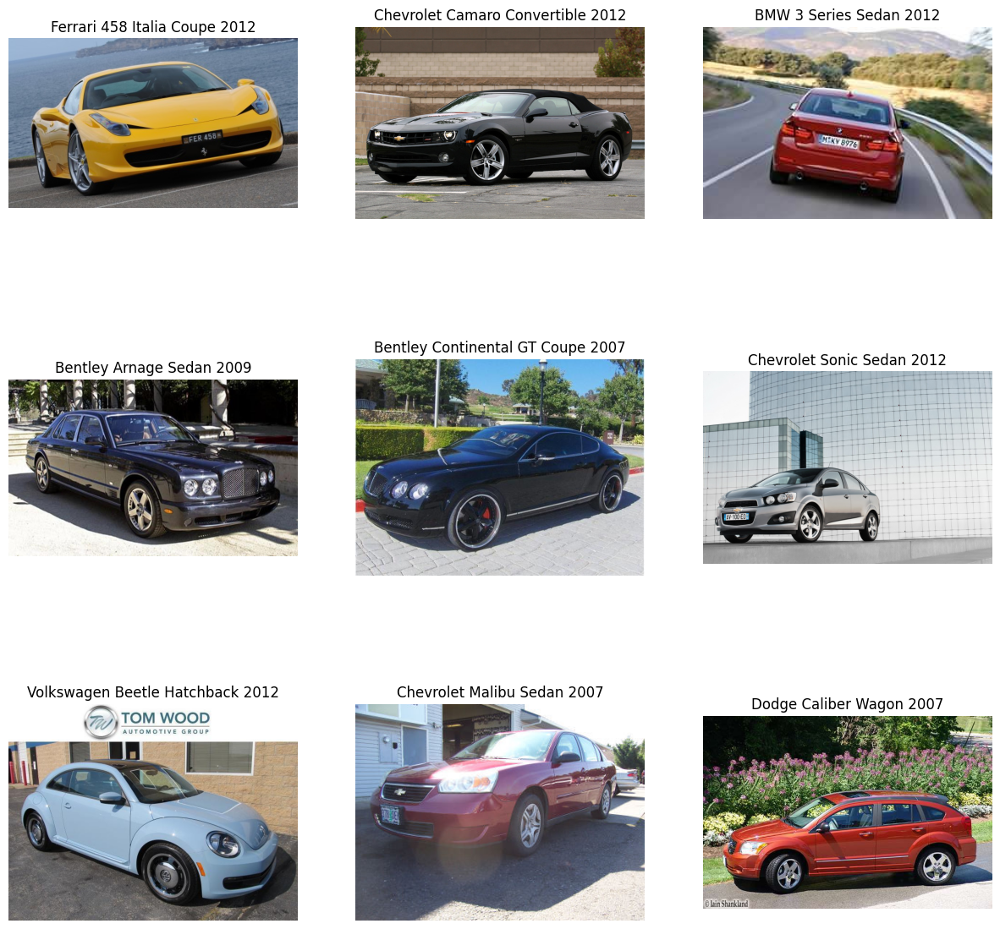

In [6]:
num_imgs = 9
cols = 3
rows = num_imgs // cols
fig, ax = plt.subplots(rows, cols, figsize = (15, 15))
for idx, im_idx in enumerate(random.sample([i for i in range(len(fname_to_class))], num_imgs)):
    filename, cl_id = list(fname_to_class.items())[im_idx]
    temp_image = cv2.imread(os.path.join(ADD_PATH, filename))
    temp_image = cv2.cvtColor(temp_image, cv2.COLOR_BGR2RGB)
    ax[idx//cols][idx%cols].imshow(temp_image)
    ax[idx//cols][idx%cols].set_title(f'{id_to_car[cl_id]}')
    ax[idx//cols][idx%cols].axis('off')

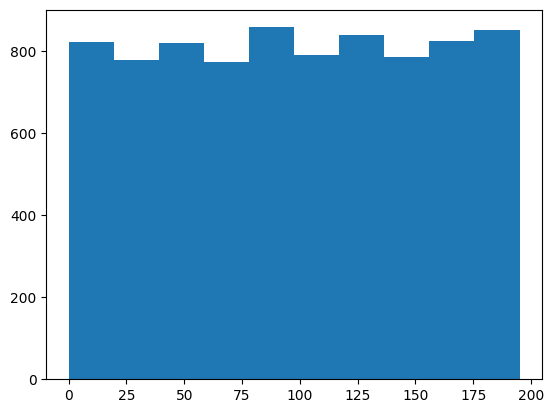

In [8]:
plt.hist(fname_to_class.values())
plt.show()

In [11]:
import torch
import torchvision
from torch.utils.data import DataLoader
from sklearn.model_selection import train_test_split

val_transforms =  torchvision.transforms.Compose([
            torchvision.transforms.ToPILImage(),
            torchvision.transforms.Resize(
                size=(224, 224)
            ),
            torchvision.transforms.ToTensor(),
            torchvision.transforms.Normalize(
                mean=[0.485, 0.456, 0.406],
                std=[0.229, 0.224, 0.225]
            )
            ])

class CropClassifDataset(torch.utils.data.Dataset):
    def __init__(self, cars_items, transforms):
        self.cars = cars_items
        self.transforms = transforms

    def __len__(self):
        return len(self.cars)

    def __getitem__(self, idx):
        filename, cl_id = self.cars[idx]
        image = cv2.imread(os.path.join(ADD_PATH, filename))
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        if self.transforms:
            image = self.transforms(image)
        sample = {'image': image, 'label': cl_id}
        return sample

In [12]:
train_trasfrom = torchvision.transforms.Compose([
            torchvision.transforms.ToPILImage(),
            torchvision.transforms.Resize(
                size=(224, 224)
            ),
            torchvision.transforms.ToTensor(),
            torchvision.transforms.Normalize(
                mean=[0.485, 0.456, 0.406],
                std=[0.229, 0.224, 0.225]
            ),
            #torchvision.transforms.CenterCrop(10),
            torchvision.transforms.RandomVerticalFlip(),
            torchvision.transforms.RandomRotation(15),
            torchvision.transforms.GaussianBlur(kernel_size=(51,51)),
            torchvision.transforms.RandomGrayscale(),
            ])

In [13]:
items = list(fname_to_class.items())
random.shuffle(items)
train_items = items[:int(len(items) * 0.8)]
val_items = items[int(len(items) * 0.8):]

train_dataset = CropClassifDataset(train_items, train_trasfrom)
val_dataset = CropClassifDataset(val_items, val_transforms)

In [14]:
train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True, num_workers=2, collate_fn=None, pin_memory=True, drop_last = True)
valid_loader = DataLoader(val_dataset, batch_size=64, shuffle=False, num_workers=2, collate_fn=None, pin_memory=True)

In [15]:
!pip install lightning pytorch_metric_learning

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 34.9 MB/s eta 0:00:00a 0:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 115.3/115.3 kB 11.6 MB/s eta 0:00:00


In [16]:
import lightning.pytorch as pl
from lightning.pytorch.callbacks import ModelCheckpoint
from lightning.pytorch.callbacks.early_stopping import EarlyStopping
from lightning.pytorch.callbacks import LearningRateMonitor
from torchvision.models import googlenet
from pytorch_metric_learning import miners, losses

class CarEmbedder(pl.LightningModule):
    def __init__(self, class_dict, learning_rate, emb_size):
        super().__init__()
        self.learning_rate = learning_rate
        self.model = googlenet(pretrained=True)

        self.model.fc = torch.nn.Sequential(
                            torch.nn.Linear(in_features=1024, out_features=emb_size))
        self.classifier_head = torch.nn.Sequential(
                            torch.nn.ReLU(),
                            torch.nn.Linear(in_features=emb_size, out_features=len(class_dict)))
        #self.arc_face_loss = losses.ArcFaceLoss(len(class_dict), emb_size, margin=28.6, scale=64)
        self.triplet_miner = miners.TripletMarginMiner(type_of_triplets="semihard")
        self.triplet_loss = losses.TripletMarginLoss()
        #self.classif_loss = torch.nn.CrossEntropyLoss()
        self.alpha = 0.4

        self.save_hyperparameters()

    def training_step(self, batch, batch_idx):
        images = batch['image']
        labels = batch['label'].to(torch.long)
        preds = self.model(images)

        hard_pairs = self.triplet_miner(preds, labels)
        final_loss = self.triplet_loss(preds, labels, hard_pairs)

        self.log("train_loss", final_loss, sync_dist=True)
        return final_loss

    def validation_step(self, batch, batch_idx):
        images = batch['image']
        labels = batch['label'].to(torch.long)
        preds = self.model(images)

        hard_pairs = self.triplet_miner(preds, labels)
        final_loss = self.triplet_loss(preds, labels, hard_pairs)

        self.log("validation_loss", final_loss, sync_dist=True)

    def forward(self, images):
        if len(images.shape) == 4:
            preds = self.model(images)
        else:
            preds = self.model(images.unsqueeze(0))
        return preds

    def configure_optimizers(self):
        optimizer = torch.optim.Adam(self.parameters(), lr=self.learning_rate)
        return [optimizer]

In [17]:
device

'cuda'

In [18]:
# model
pl_model = CarEmbedder(id_to_car, 3e-4, 512)
checkpoint_callback = ModelCheckpoint(monitor='validation_loss',mode='min',  save_top_k=3)
early_stopping = EarlyStopping(monitor="validation_loss", mode="min", patience=2)
lr_monitor = LearningRateMonitor(logging_interval='step')

# train model
trainer = pl.Trainer(max_epochs = 2, accelerator=device, devices = 1, callbacks=[checkpoint_callback, early_stopping, lr_monitor])

/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=GoogLeNet_Weights.IMAGENET1K_V1`. You can also use `weights=GoogLeNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/googlenet-1378be20.pth" to /root/.cache/torch/hub/checkpoints/googlenet-1378be20.pth
100%|██████████| 49.7M/49.7M [00:00<00:00, 199MB/s]
INFO: GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HPUs


In [19]:
trainer.fit(model=pl_model, train_dataloaders=train_loader,
            val_dataloaders=valid_loader)

INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
  | Name            | Type               | Params
-------------------------------------------------------
0 | model           | GoogLeNet          | 6.1 M 
1 | classifier_head | Sequential         | 100 K 
2 | triplet_miner   | TripletMarginMiner | 0     
3 | triplet_loss    | TripletMarginLoss  | 0     
-------------------------------------------------------
6.2 M     Trainable params
0         Non-trainable params
6.2 M     Total params
24.901    Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: `Trainer.fit` stopped: `max_epochs=2` reached.


In [20]:
trainer.validate(model=pl_model, dataloaders=valid_loader)

INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Validation: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃      Validate metric      ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│      validation_loss      │   0.024501867592334747    │
└───────────────────────────┴───────────────────────────┘

[{'validation_loss': 0.024501867592334747}]

In [21]:
%load_ext tensorboard
%tensorboard --logdir ./lightning_logs
%reload_ext tensorboard

In [22]:
import tqdm
import numpy as np
pl_model.eval()
pl_model.to(device)
np.float32

numpy.float32

In [24]:
def get_embeds(model, loader):
    embeddings = np.empty((1,512))
    labels = np.empty((1))
    for batch in tqdm.tqdm_notebook(loader):
        imgs = batch['image']
        label = batch['label']
        with torch.no_grad():
            preds = model(imgs.to(device))
        embeddings = np.concatenate([embeddings, preds.cpu().numpy()])
        labels = np.concatenate([labels, label.numpy()])
    return embeddings[1:].astype(np.float32), labels[1:]

In [25]:
train_emb, train_labels = get_embeds(pl_model, train_loader)
val_emb, val_labels = get_embeds(pl_model, valid_loader)

/tmp/ipykernel_32/3342089651.py:4: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for batch in tqdm.tqdm_notebook(loader):


  0%|          | 0/101 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

In [56]:
val_labels

array([182.,   8.,   7., ...,  30.,  59., 174.])

In [27]:
!pip install faiss-gpu

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.5/85.5 MB 14.7 MB/s eta 0:00:0000:0100:01


In [28]:
import faiss                   # make faiss available
index = faiss.IndexFlatL2(512)   # build the index
print(index.is_trained)
index.add(train_emb)                  # add vectors to the index
print(index.ntotal)



True
6464


In [41]:
K = 5

In [58]:
Indexes[1]

array([1086,  211, 1398, 5681, 3102])

In [42]:
Distances, Indexes = index.search(val_emb, K)

In [76]:
Indexes[100][0]

4880

In [62]:
# pred_labels[i]  
# k neares emb : train_labels[Indexes[i]] 
#  true_positive_count (max k) 

In [81]:
def precision_at_k(train_labels, pred_labels, Indexes, k):

    precision_per_example = []

    for i in range(len(pred_labels)):
        true_positive_count = np.sum(pred_labels[i] == train_labels[Indexes[i]])
        precision = true_positive_count / k
        precision_per_example.append(precision)

    precision = np.mean(precision_per_example)
    return precision


In [83]:
# TP/ (TP + FN) = TP / ([все реальные +1])
def recall_at_k(train_labels, pred_labels, Indexes, k):

    recall_per_example = []
    for i in range(len(pred_labels)):
        true_label = train_labels[Indexes[i][0]]
        true_positive_count = np.sum(pred_labels[i] == train_labels[Indexes[i]])
        tp_fp = np.sum(train_labels[Indexes[i]] == true_label) # max k
        recall = true_positive_count / tp_fp
        recall_per_example.append(recall)
    
    recall = np.mean(recall_per_example)
    return recall


In [89]:
COUNT_CLASS = 196

In [90]:
def mean_average_precision(train_labels, pred_labels, Indexes, k):
    average_precisions = []
    
    for num_class in range(COUNT_CLASS):
        tp = 0
        tp_fp = 0
        for i in range(len(pred_labels)):
            if int(pred_labels[i]) == num_class:
                tp += np.sum(pred_labels[i] == train_labels[Indexes[i]])
                tp_fp += k
        if tp_fp:
            average_precisions.append(tp / tp_fp)

    mAP = np.mean(average_precisions)
    return mAP



In [91]:
precision_K = precision_at_k(train_labels, val_labels, Indexes, K)
print(f"Precision@{K} = {precision_K}")
recall_K = recall_at_k(train_labels, val_labels, Indexes, K)
print(f"Recall@{K} = {recall_K}")
mAP = mean_average_precision(train_labels, val_labels, Indexes, K)
print(f"mAP = {mAP}")

Precision@5 = 0.020012277470841007
Recall@5 = 0.09238796807857581
mAP = 0.020837820059758833


In [93]:
!pip install grad-cam

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 63.7 MB/s eta 0:00:00:00:0100:01
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for grad-cam: filename=grad_cam-1.4.8-py3-none-any.whl size=38244 sha256=3519f3fea5992e7fb6ce33144d41d218fa19c048f67d81c2434c82e780fd97f2
  Stored in directory: /root/.cache/pip/wheels/f8/04/36/94ff3c8a4215826a21946b34c01180817e606989fdf53f7cd6
Successfully built grad-cam


In [94]:
from PIL import Image
import requests
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.image import show_cam_on_image

transform_to_show = torchvision.transforms.Compose([
                        torchvision.transforms.ToPILImage(), 
                        torchvision.transforms.Resize(
                            size=(224, 224)
                        ),
                        torchvision.transforms.ToTensor()
                        ])

def get_image_from_path(path):
    """A function that gets a path to an image, 
    and returns a numpy image and a preprocessed
    torch tensor ready to pass to the model """

    orig_im = np.array(Image.open(path).convert('RGB'))
    rgb_im = np.array(transform_to_show(orig_im).permute(1,2,0))
    transformed_im = val_transforms(orig_im).unsqueeze(0).to(device)
    orig_im = cv2.resize(orig_im, (512, 512))

    return orig_im, rgb_im, transformed_im

In [100]:
car_img, car_img_float, car_tensor = get_image_from_path("./cars_train/cars_train/07824.jpg")
car_concept_features = pl_model(car_tensor)[0, :]


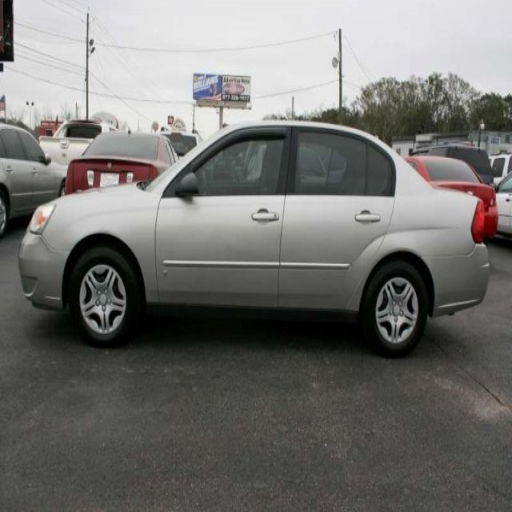

In [101]:
Image.fromarray(car_img)

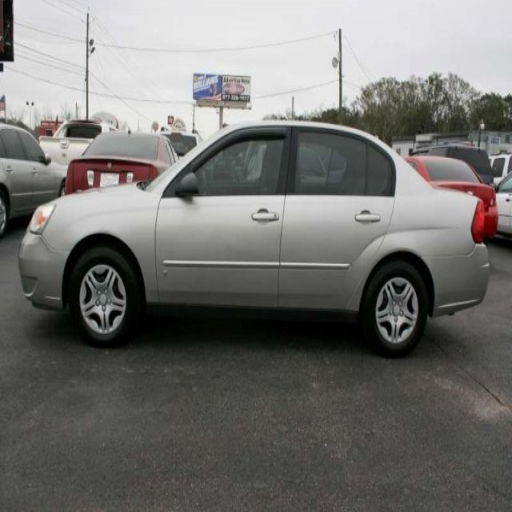

In [120]:
image, image_float, input_tensor = get_image_from_path("./cars_train/cars_train/07824.jpg")
Image.fromarray(image)

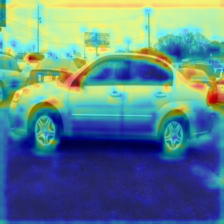

In [122]:
class SimilarityToConceptTarget:
    def __init__(self, features):
        self.features = features
    
    def __call__(self, model_output):
        cos = torch.nn.CosineSimilarity(dim=0)
        return cos(model_output, self.features)
    
target_layers = [pl_model.model.conv3]
car_targets = [SimilarityToConceptTarget(car_concept_features)]

# Where is the car in the image
with GradCAM(model=pl_model.model,
             target_layers=target_layers,
             use_cuda=False) as cam:
    car_grayscale_cam = cam(input_tensor=input_tensor,
                        targets=car_targets)[0, :]
car_cam_image = show_cam_on_image(image_float, car_grayscale_cam, use_rgb=True)
Image.fromarray(car_cam_image)

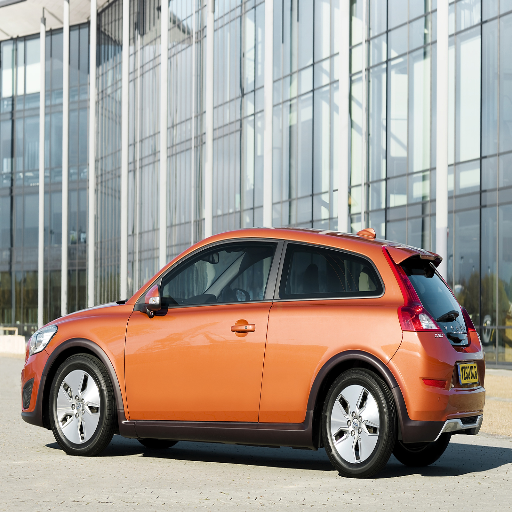

In [123]:
image, image_float, input_tensor = get_image_from_path("./cars_train/cars_train/03224.jpg")
Image.fromarray(image)

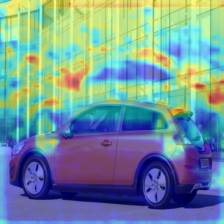

In [124]:
car_cam_image = show_cam_on_image(image_float, car_grayscale_cam, use_rgb=True)
Image.fromarray(car_cam_image)

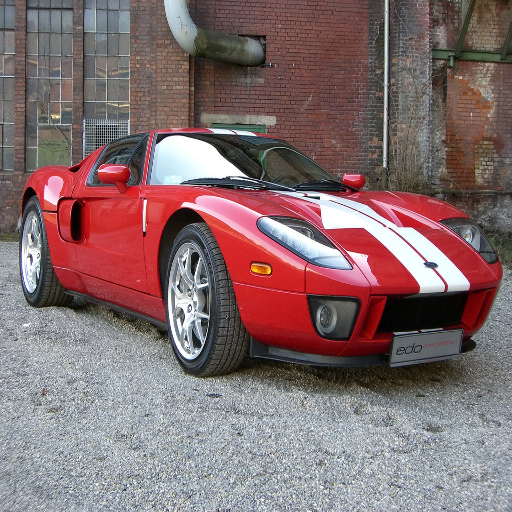

In [125]:
image, image_float, input_tensor = get_image_from_path("./cars_train/cars_train/03524.jpg")
Image.fromarray(image)

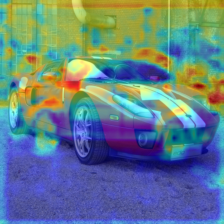

In [126]:
car_cam_image = show_cam_on_image(image_float, car_grayscale_cam, use_rgb=True)
Image.fromarray(car_cam_image)